# Домашнее задание 2-1. Задача 4. Вариационный автокодировщик.

Выполнил: Чемров Кирилл Сергеевич, группа Б01-811

Преподаватели: Грабовой Андрей Валериевич, Воронцов Константин Вячеславович

# Библиотеки

In [ ]:
from copy import deepcopy

import matplotlib.pyplot as plt
from matplotlib.image import imread
from mpl_toolkits import mplot3d
from matplotlib import gridspec
from PIL import Image
import io
import os
from urllib.request import urlopen
from skimage.segmentation import mark_boundaries

from tqdm.notebook import tqdm
import numpy as np
import requests
from scipy.stats import norm
import torch

from sklearn.metrics import classification_report
from torch.utils.tensorboard import SummaryWriter

from torchvision import datasets, transforms

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cpu'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Полезные функции для обучения и тестирования моделей

In [ ]:
def train_epoch(train_generator, model, loss_function, optimizer, callback = None):
    epoch_loss = 0
    total = 0
    for it, (batch_of_x, batch_of_y) in enumerate(train_generator):
        batch_loss = train_on_batch(model, batch_of_x, batch_of_y, optimizer, loss_function)
        
        if callback is not None:
            with torch.no_grad():
                callback(model, batch_loss)
            
        epoch_loss += batch_loss*len(batch_of_x)
        total += len(batch_of_x)
    
    return epoch_loss/total

In [ ]:
def trainer(count_of_epoch, 
            batch_size, 
            dataset,
            model, 
            loss_function,
            optimizer,
            lr = 0.001,
            callback = None):
    
    optima = optimizer(model.parameters(), lr=lr)
    
    iterations = tqdm(range(count_of_epoch), desc='epoch')
    iterations.set_postfix({'train epoch loss': np.nan})
    for it in iterations:
        batch_generator = tqdm(
            torch.utils.data.DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True), 
            leave=False, total=len(dataset)//batch_size+(len(dataset)%batch_size> 0))
        
        epoch_loss = train_epoch(train_generator=batch_generator, 
                    model=model, 
                    loss_function=loss_function, 
                    optimizer=optima, 
                    callback=callback)
        
        iterations.set_postfix({'train epoch loss': epoch_loss})

Функция callback для отслеживания в тензорборде обучения модели

In [ ]:
class callback():
    def __init__(self, writer, dataset, loss_function, delimeter = 100, batch_size=64):
        self.step = 0
        self.writer = writer
        self.delimeter = delimeter
        self.loss_function = loss_function
        self.batch_size = batch_size

        self.dataset = dataset

    def forward(self, model, loss):
        self.step += 1
        self.writer.add_scalar('LOSS/train', loss, self.step)
        
        if self.step % self.delimeter == 0:
            batch_generator = torch.utils.data.DataLoader(dataset = self.dataset, 
                                                          batch_size=self.batch_size)
            test_loss = 0
            model.eval()
            for it, (x_batch, y_batch) in enumerate(batch_generator):
                x_batch = x_batch.to(model.device)
                pred_mu = model(x_batch)
                test_loss += self.loss_function(pred_mu, x_batch).cpu().item()*len(x_batch)
            test_loss /= len(self.dataset)
            self.writer.add_scalar('LOSS/test', test_loss, self.step)
          
    def __call__(self, model, loss):
        return self.forward(model, loss)

 Специально для VAE

In [ ]:
def train_on_batch(model, x_batch, y_batch, optimizer, loss_function):
    model.train()
    optimizer.zero_grad()
    
    loss = model.loss(x_batch.to(model.device), y_batch.to(model.device))
    loss.backward()

    optimizer.step()
    return loss.cpu().item()

# Модель

In [ ]:
class VAE(torch.nn.Module):
    @property
    def device(self):
        return next(self.parameters()).device

    def __init__(self, latent_dim, input_dim, hidden_dim=200, add_layer=False):
        """
        Standart model of VAE with ELBO optimization.
        Args:
            latent_dim: int - the dimension of latent space.
            input_dim: int - the dimension of input space.
            hidden_dim: int - the size of hidden_dim neural layer.
        Returns:
            None
        Example:
            >>> model = VAE(2, 10)
        """
        super(VAE, self).__init__()
        self.latent_dim = latent_dim
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.add_layer = add_layer

        self.proposal_z = torch.nn.Sequential(
            torch.nn.Linear(input_dim, hidden_dim),
            torch.nn.LeakyReLU(),
        )
        self.proposal_mu = torch.nn.Linear(hidden_dim, latent_dim)
        self.proposal_sigma = torch.nn.Linear(hidden_dim, latent_dim)

        self.proposal_x = torch.nn.Sequential(
            torch.nn.Linear(latent_dim, hidden_dim),
            torch.nn.LeakyReLU(),
        )
        self.proposal_x_mu = torch.nn.Linear(hidden_dim, input_dim)
        self.proposal_x_sigma = torch.nn.Linear(hidden_dim, input_dim)

        # for 2-layers model
        self.proposal_mu_2l = torch.nn.Sequential(
            torch.nn.Linear(hidden_dim, int((latent_dim + hidden_dim)/2)),
            torch.nn.LeakyReLU(),
            torch.nn.Linear(int((latent_dim + hidden_dim)/2), latent_dim),
        )
        self.proposal_sigma_2l = torch.nn.Sequential(
            torch.nn.Linear(hidden_dim, int((latent_dim + hidden_dim)/2)),
            torch.nn.LeakyReLU(),
            torch.nn.Linear(int((latent_dim + hidden_dim)/2), latent_dim),
        )
        self.proposal_mu_x_2l = torch.nn.Sequential(
            torch.nn.Linear(hidden_dim, int((input_dim + hidden_dim)/2)),
            torch.nn.LeakyReLU(),
            torch.nn.Linear(int((input_dim + hidden_dim)/2), input_dim),
        )
        self.proposal_sigma_x_2l = torch.nn.Sequential(
            torch.nn.Linear(hidden_dim, int((input_dim + hidden_dim)/2)),
            torch.nn.LeakyReLU(),
            torch.nn.Linear(int((input_dim + hidden_dim)/2), input_dim),
        )

        # self.generative_network = torch.nn.Sequential(
        #     torch.nn.Linear(self.latent_dim, hidden_dim),
        #     torch.nn.LeakyReLU(),
        #     torch.nn.Linear(hidden_dim, self.input_dim),
        #     torch.nn.Sigmoid()
        #)

    def q_z(self, x):
        """
        Generates distribution of z provided x.
        Args:
            x: Tensor - the matrix of shape batch_size x input_dim.
        Returns:
            tuple(Tensor, Tensor) - the normal distribution parameters.
            mu: Tensor - the matrix of shape batch_size x latent_dim.
            sigma: Tensor - the matrix of shape batch_size x latent_dim.
        Example:
            >>>
        """
        x = x.to(self.device)

        proposal = self.proposal_z(x)
        if self.add_layer:
            mu = self.proposal_mu_2l(proposal)
            sigma = torch.nn.Softplus()(self.proposal_sigma_2l(proposal))
        else:
            mu = self.proposal_mu(proposal)
            sigma = torch.nn.Softplus()(self.proposal_sigma(proposal))
        return mu, sigma

    def p_z(self, num_samples):
        """
        Generetes prior distribution of z.
        Args:
            num_samples: int - the number of samples.
        Returns:
            tuple(Tensor, Tensor) - the normal distribution parameters.
                mu: Tensor - the matrix of shape num_samples x latent_dim.
            	sigma: Tensor - the matrix of shape num_samples x latent_dim.
        Example:
            >>>
        """
        mu = torch.zeros([num_samples, self.latent_dim], device=self.device)
        sigma = torch.ones([num_samples, self.latent_dim], device=self.device)
        return mu, sigma

    def sample_z(self, distr, num_samples=1):
        """
        Generates samples from normal distribution q(z|x).
        Args:
            distr = (mu, sigma): tuple(Tensor, Tensor) - the normal distribution parameters.
                mu: Tensor - the matrix of shape batch_size x latent_dim.
                sigma: Tensor - the matrix of shape batch_size x latent_dim.
            num_samples: int - the number of samples for each element.
        Returns:
            Tensor - the tensor of shape batch_size x num_samples x latent_dim - samples from normal distribution in latent space.
        Example:
            >>>
        """
        mu, sigma = distr
        mu = mu.to(self.device)
        sigma = sigma.to(self.device)

        batch_size = mu.shape[0]

        bias = mu.view([batch_size, 1, self.latent_dim])

        epsilon = torch.randn([batch_size, num_samples, self.latent_dim],
                              requires_grad=True,
                              device=self.device)
        scale = sigma.view([batch_size, 1, self.latent_dim])

        return bias + epsilon * scale

    def q_x(self, z):
        """
        Given the latent representation matrix z, returns the matrix of Bernoulli distribution parameters for sampling x objects.
        Args:
            z: Tensor - the tensor of shape batch_size x num_samples x latent_dim, samples from latent space.
        Returns:
            Tensor - the tensor of shape batch_size x num_samples x input_dim, Bernoulli distribution parameters.
        Example:
            >>>
        """
        # z = z.to(self.device)
        # out = self.generative_network(z)
        # return torch.clamp(out, 0.01, 0.99)
        
        #Вместо бернуливского распределения нормальное
        z = z.to(self.device)
        proposal_x = self.proposal_x(z).to(self.device)

        if self.add_layer:
            mu = self.proposal_mu_x_2l(proposal_x).to(self.device)
            sigma = torch.nn.Softplus()(self.proposal_sigma_x_2l(proposal_x).to(self.device))
        else:
            mu = self.proposal_x_mu(proposal_x).to(self.device)
            sigma = torch.nn.Softplus()(self.proposal_x_sigma(proposal_x).to(self.device))

        return mu, sigma

    def loss(self, batch_x, batch_y):
        """
        Calculate ELBO approximation of log likelihood for given batch with negative sign.
        Args:
            batch_x: FloatTensor - the matrix of shape batch_size x input_dim.
            batch_y: FloatTensor - dont uses parameter in this model.
        Returns:
            Tensor - scalar, ELBO approximation of log likelihood for given batch with negative sign.
        Example:
            >>>
        """
        batch_x = batch_x.to(self.device)
        batch_y = batch_y.to(self.device)

        batch_size = batch_x.shape[0]

        propos_distr = self.q_z(batch_x)
        pri_distr = self.p_z(batch_size)

        x_distr = self.q_x(self.sample_z(propos_distr))

        expectation = torch.mean(
            self.log_mean_exp(
                self.log_likelihood(
                    batch_x, x_distr)), dim=0)

        divergence = self.divergence_KL_normal(propos_distr, pri_distr)

        return -1 * torch.mean(expectation - divergence, dim=0)

    def generate_samples(self, num_samples):
        """
        Generate samples of object x from noises in latent space.
        Args:
            num_samples: int - the number of samples, witch need to generate.
        Returns:
            Tensor - the matrix of shape num_samples x input_dim.
        Example:
            >>>
        """
        distr_z = self.p_z(num_samples=1)

        z = self.sample_z(distr_z, num_samples=num_samples)

        distr_x = self.q_x(z)
        mu, sigma = distr_x
        return torch.normal(mu, sigma, device=self.device)

    @staticmethod
    def log_pdf_normal(distr, samples):
        """
        The function calculates the logarithm of the probability density at a point relative to the corresponding normal distribution given componentwise by its mean and standard deviation.
        Args:
            distr = (mu, sigma): tuple(Tensor, Tensor) - the normal distribution parameters.
                mu: Tensor - the matrix of shape batch_size x latent_dim.
                sigma: Tensor - the matrix of shape batch_size x latent_dim.
            samples: Tensor - the tensor of shape batch_size x num_samples x latent_dim, samples in latent space.
        Returns:
            Tensor - the matrix of shape batch_size x num_samples, each element of which is the logarithm of the probability density of a point relative to the corresponding distribution.
        Example:
            >>>
        """
        mu, sigma = distr

        batch_size = mu.shape[0]
        latent_dim = mu.shape[1]

        f1 = torch.sum(((samples -
                         mu.view([batch_size, 1, latent_dim]))**2) /
                       sigma.view([batch_size, 1, latent_dim])**2, dim=2)
        f2 = mu.shape[1] * (math.log(2) + math.log(math.pi))
        f3 = torch.sum(torch.log(sigma), dim=1).view(batch_size, 1)
        return -0.5 * (f1 + f2) - f3

    @staticmethod
    def log_likelihood(x_true, x_distr):
        """
        Calculate log likelihood between x_true and x_distr.
        Args:
            x_true:  Tensor - the matrix of shape batch_size x input_dim.
            x_distr: Tensor - the tensor of shape batch_size x num_samples x input_dim, Bernoulli distribution parameters.
        Returns:
            Tensor - the matrix of shape batch_size x num_samples - log likelihood for each sample.
        Example:
            >>>
        """
        mu, sigma = x_distr

        batch_size = mu.shape[0]
        input_dim = mu.shape[2]

        #меняем функцию ошибок под нормальное распределение
        normal_log_likelihood = - 1/2 * (x_true.view([batch_size, 1, input_dim])-mu)**2 / (sigma**2) - 1/2 * torch.log(sigma**2)

        return torch.sum(normal_log_likelihood, dim=2)

    @staticmethod
    def log_mean_exp(data):
        """
        Args:
            data: Tensor - the tensor of shape n_1 x n_2 x ... x n_K.
        Returns:
            Tensor - the tensor of shape n_1 x n_2 x ,,, x n_{K - 1}.
        Example:
            >>>
        """

        return torch.logsumexp(data, dim=-1) - \
            torch.log(torch.Tensor([data.shape[-1]]).to(data.device))

    @staticmethod
    def divergence_KL_normal(q_distr, p_distr):
        """
        Calculate KL-divergence KL(q||p) between n-pairs of normal distribution.
        Args:
            q_distr=(mu, sigma): tuple(Tensor, Tensor) - the normal distribution parameters.
                mu: Tensor - the matrix of shape batch_size x latent_dim.
                sigma: Tensor - the matrix of shape batch_size x latent_dim.
            p_distr=(mu, sigma): tuple(Tensor, Tensor) - the normal distribution parameters.
                mu: Tensor - the matrix of shape batch_size x latent_dim.
                sigma: Tensor - the matrix of shape batch_size x latent_dim.
        Returns:
            Tensor - the vector of shape n, each value of which is a KL-divergence between pair of normal distribution.
        Example:
            >>>
        """
        q_mu, q_sigma = q_distr
        p_mu, p_sigma = p_distr

        D_KL = torch.sum((q_sigma / p_sigma)**2, dim=1)
        D_KL -= p_mu.shape[1]
        D_KL += 2 * torch.sum(torch.log(p_sigma), dim=1) - \
            2 * torch.sum(torch.log(q_sigma), dim=1)
        D_KL += torch.sum((p_mu - q_mu) * (p_mu - q_mu) / (p_sigma**2), dim=1)
        return 0.5 * D_KL

    def forward(self, x):
      """
        Generate decoded sample after encoding.
        Args:
            x: Tensor - the matrix of shape batch_size x input_dim.
        Returns:
            Tensor - the matrix of shape batch_size x input_dim.
        Example:
            >>>
        """
      mu, sigma = self.q_x(self.sample_z(self.q_z(x)))
      #возвращаем параметры распределения
      return torch.squeeze(mu)#, torch.squeeze(sigma)

# Синтетическая выборка

Представляет из себя вектора размерности input_dim. По 12500 вектором принадлежит одному из 5 классов с фиксированным средним значением μ. При этом оставляем у всех классов одинаковую σ для наглядности функции ошибок.

In [ ]:
n_mus = 5
vectors_per_mu = 12500
input_dim = 10

torch.manual_seed(42)
mu = (torch.rand(n_mus, input_dim) - 0.5) * 5 # [-2.5, 2.5]
mu = mu.repeat(vectors_per_mu, 1)
sigma = torch.ones(mu.shape)
vectors = torch.normal(mean=mu, std=sigma)

vectors.shape

torch.Size([62500, 10])

Разделим выборку на обучающую (80%) и тестовую (20%)

In [ ]:
train_mask = (np.random.rand(vectors_per_mu*n_mus) < 0.8)
data_train = vectors[train_mask]
data_test = vectors[~train_mask]
data_train_pt = torch.utils.data.TensorDataset(data_train, data_train)
data_test_pt = torch.utils.data.TensorDataset(data_test, data_test)

Примеры проекций векторов из тестовой выборки

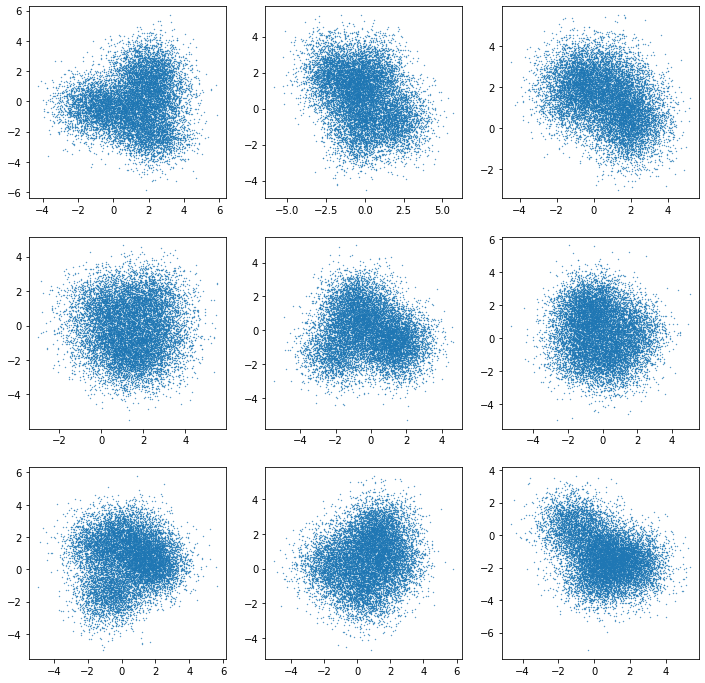

In [ ]:
fig = plt.figure(figsize=(12, 12))
for i in range(input_dim-1):
  ax = fig.add_subplot(331+i)
  ax.plot(data_test[:, i], data_test[:, i+1], '.',markersize=0.7)
plt.show()

# Исходная модель

Входная размерность: 10

Латентная размерность: 6

Скрытая размерность: 5

In [ ]:
optimizer = torch.optim.Adam
loss_function = torch.nn.MSELoss()

In [ ]:
autoencoder = VAE(latent_dim=6, input_dim=input_dim, hidden_dim=5)
autoencoder.to(device)

writer = SummaryWriter(log_dir = f'/content/drive/MyDrive/Colab Notebooks/task_1-4/layers-1_indim-{input_dim}_latdim-6')
call = callback(writer, data_test_pt, loss_function, delimeter = 25)

In [ ]:
trainer(count_of_epoch=25, 
        batch_size=64, 
        dataset=data_train_pt,
        model=autoencoder, 
        loss_function=loss_function,
        optimizer = optimizer,
        lr = 0.001,
        callback = call)

epoch:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

# Проварьируем латентную и входную размерности

При варьировании входной размерности сохраняем отношение входной размерности к латентной (5/2 и 5/4). Размерность скрытого пространства оставляем постоянным и равным 20.

In [ ]:
for input_dim in [25, 50]: #10, 25, 50
    for lat_dim10 in [4, 8]: #lat_dim for input_dim=10
        lat_dim = int(lat_dim10 *input_dim/10)
        # Генерация выборка
        mu = (torch.rand(n_mus, input_dim) - 0.5) * 5 # [-2.5, 2.5]
        mu = mu.repeat(vectors_per_mu, 1)
        sigma = torch.ones(mu.shape)
        vectors = torch.normal(mean=mu, std=sigma)
        # Разделение выборки
        train_mask = (np.random.rand(vectors_per_mu*n_mus) < 0.8)
        data_train = vectors[train_mask]
        data_test = vectors[~train_mask]
        data_train_pt = torch.utils.data.TensorDataset(data_train, data_train)
        data_test_pt = torch.utils.data.TensorDataset(data_test, data_test)
        # Модель
        optimizer = torch.optim.Adam
        loss_function = torch.nn.MSELoss()
        autoencoder = VAE(latent_dim=lat_dim, input_dim=input_dim, hidden_dim=20)
        autoencoder.to(device)
        # Папка и функция callback для tensorboard
        writer = SummaryWriter(log_dir = f'/content/drive/MyDrive/Colab Notebooks/task_1-4/layers-1_indim-{input_dim}_latdim-{lat_dim}')
        call = callback(writer, data_test_pt, loss_function, delimeter = 50) 
        # Обучение
        trainer(count_of_epoch=25, 
                batch_size=64, 
                dataset=data_train_pt,
                model=autoencoder, 
                loss_function=loss_function,
                optimizer = optimizer,
                lr = 0.001,
                callback = call)

epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

  0%|          | 0/783 [00:00<?, ?it/s]

epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

  0%|          | 0/785 [00:00<?, ?it/s]

# Усложним модель

Для этого добавим дполнительный линейный слой между латентным и скрытым (и соответственно между скрытым и выходным)

Как и ранее, проварьируем латентную и входную размерности

In [ ]:
for input_dim in [10, 25, 50]: #10, 25, 50
    for lat_dim10 in [4, 8]: #lat_dim for input_dim=10
        lat_dim = int(lat_dim10 *input_dim/10)
        # Генерация выборка
        mu = (torch.rand(n_mus, input_dim) - 0.5) * 5 # [-2.5, 2.5]
        mu = mu.repeat(vectors_per_mu, 1)
        sigma = torch.ones(mu.shape)
        vectors = torch.normal(mean=mu, std=sigma)
        # Разделение выборки
        train_mask = (np.random.rand(vectors_per_mu*n_mus) < 0.8)
        data_train = vectors[train_mask]
        data_test = vectors[~train_mask]
        data_train_pt = torch.utils.data.TensorDataset(data_train, data_train)
        data_test_pt = torch.utils.data.TensorDataset(data_test, data_test)
        # Модель
        optimizer = torch.optim.Adam
        loss_function = torch.nn.MSELoss()
        autoencoder = VAE(latent_dim=lat_dim, input_dim=input_dim, hidden_dim=20, add_layer=True)
        autoencoder.to(device)
        # Папка и функция callback для tensorboard
        writer = SummaryWriter(log_dir = f'/content/drive/MyDrive/Colab Notebooks/task_1-4/layers-2_indim-{input_dim}_latdim-{lat_dim}')
        call = callback(writer, data_test_pt, loss_function, delimeter = 50) 
        # Обучение
        trainer(count_of_epoch=25, 
                batch_size=64, 
                dataset=data_train_pt,
                model=autoencoder, 
                loss_function=loss_function,
                optimizer = optimizer,
                lr = 0.001,
                callback = call)

epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

  0%|          | 0/780 [00:00<?, ?it/s]

epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

  0%|          | 0/784 [00:00<?, ?it/s]

epoch:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

  0%|          | 0/781 [00:00<?, ?it/s]

# TensorBoard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/Colab Notebooks/task_1-4'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1266), started 0:30:00 ago. (Use '!kill 1266' to kill it.)

<IPython.core.display.Javascript object>

# Выводы

По сути автокодировщик восстанавливает центры классов (значения μ), а функция потерь на тесте это MSE. Таким образом, мы находим стандартное отклонение исходных вектором из класса и их среднего значения. При генерации выборки, все классы имели σ=1, поэтому функция ошибок стремится к 1.

При обучении функция потерь еще учитывает дивергенцию Кульбака-Лейблера, которая сравнивает распределения с нормальным (μ=0, σ=1), поэтому график отличается от тестового.

Исходная модель значительно отличается, так как скрытое пространство выбрано слишком маленьким.
Все остальные модели слабо отличаются друг от друга, наверное, потому что синтетическую выборку в любом случае удается легко восстановить. 

Усложнение модели тоже не влияет на результат. Во-первых, само усложнение в виде добавления одного линейного слоя несущественно. Во-вторых, восстановление даже с помощью простой модели проходит успешно.